In [1]:
import numpy as np
import scipy as sp
import torch as th

import os, pdb, sys, json, glob, tqdm
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

plt.rcParams['figure.figsize'] = [10, 10]
plt.rcParams['figure.dpi'] = 200
sns.set(context='poster',
        style='ticks',
        font_scale=1,
        rc={'axes.grid':True,
            'grid.color':'.9',
            'grid.linewidth':0.75})
%load_ext autoreload
%autoreload 2

dev = 'cuda'
root = '/home/ubuntu/ext_vol'
import sys
sys.path.insert(0, f'{root}/inpca')

from utils import get_data, get_idx, get_configs, setup, get_model

In [2]:
import plotly.graph_objects as go
import numpy as np
import plotly.offline as pyo
import pandas as pd
import plotly.express as px
pyo.init_notebook_mode()

### Visualizing Data

In [ ]:
data = th.load('/home/ubuntu/ext_vol/data/synthetic/fc-200-100-5-0.001.pt')
data_sloppy = th.load('/home/ubuntu/ext_vol/data/synthetic/fc-200-100-5-0.5.pt')

In [ ]:
x_train = {'non-sloppy': data['train'].x, 'sloppy':data_sloppy['train'].x}
y_train = {'non-sloppy': data['train'].y, 'sloppy':data_sloppy['train'].y}

In [ ]:
key = 'non-sloppy'
x = x_train[key]

In [ ]:
x -= x.mean(1, keepdims=True)
cov = np.cov(x, rowvar = False)
e, v = np.linalg.eigh(cov)
idx = np.argsort(e)[::-1]
v = v[:,idx]
e = e[idx]

a = np.dot(x, v) 

Below are two plots of the first two dimension of synthetic sloppy vs non-sloppy data. We can see sloppy data are more distinguishable in the first few dimension, and non-sloppy data has a more isotropic distribution.

In [ ]:
data = pd.DataFrame(np.hstack([x[:, :1], x[:, 1:2]]), columns=['x1', 'x2'])
data.loc[:, 'y'] = y_train[key].numpy()
ax=sns.scatterplot(data=data, x='x1', y='x2', hue='y', alpha=0.5, s=5)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
ax.set_title(f'{key} data')

In [ ]:
data = pd.DataFrame(np.hstack([x[:, :1], x[:, 1:2]]), columns=['x1', 'x2'])
data.loc[:, 'y'] = y_train[key].numpy()
ax=sns.scatterplot(data=data, x='x1', y='x2', hue='y', alpha=0.5, s=5)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
ax.set_title(f'{key} data')

In [ ]:
x = x_train[key]
num_train = x.shape[0]
e,v = np.linalg.eig(x.T@x / num_train)
ii = np.argsort(np.real(e))[::-1]
e = e[ii]
plt.plot(e)
plt.yscale("log")
plt.title(f'{key} data')

In [ ]:
x = x_train[key]
num_train = x.shape[0]
e,v = np.linalg.eig(x.T@x / num_train)
ii = np.argsort(np.real(e))[::-1]
e = e[ii]
plt.plot(e)
plt.yscale("log")
plt.title(f'{key} data')

### Compute projection

In [5]:
from compute_dist import dist_from_flist

In [7]:
all_files = glob.glob(f'/home/ubuntu/ext_vol/inpca/results/models/isog-50/*.p')
dfs = pd.DataFrame([json.loads(f[f.find("{"): f.find("}") + 1]) for f in all_files])

In [16]:
fs = {}
for ncorners in [1, 2, 5, 10]:
    iseeds = np.arange(ncorners)
    seeds = np.arange(42, 92)[:int(50/ncorners)]
    fs[ncorners] = np.array(all_files)[list(dfs[(dfs.seed.isin(seeds)) & (dfs.iseed.isin(iseeds))].index)]

In [ ]:
dist_from_flist(fs[1], loc='/home/ubuntu/ext_vol/inpca/inpca_results_all/synth', fn='1', 
                idx=["seed", "m", "opt", "t", "err", "verr", "bs", "aug", "lr", "wd", "init"],
                dev='cuda:2',
            avg_err=True, loaded=False, save_didx=True)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 400/400 [00:53<00:00,  7.41it/s]


### Synthetic Data random label

#### sloppy

In [ ]:
didx = th.load('/home/ubuntu/ext_vol/inpca/inpca_results/didx_yh_sloppy-random.p')['dc'].reset_index(drop=True)
w = th.load('/home/ubuntu/ext_vol/inpca/inpca_results/w_yh_sloppy-random.p')

In [ ]:
from embed import proj_
l = np.eye(w.shape[0]) - 1.0/w.shape[0]
w = -l @ w @ l / 2
r = proj_(w, w.shape[0], 3)
r['fn'] = np.linalg.norm(w, ord='fro')

In [ ]:
emph = get_idx(didx, "m=='geodesic'")
fig = plotly_3d(didx, r, emph=[emph], empcolor='red', empsize=3, empmode='markers',
              return_text=False, return_d=False, ne=3, dims=[1, 2, 3],
              cols=['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'lr', 'wd', 'init'],
              groups = ['seed', 'm', 'opt', 'bs', 'aug', 'lr', 'wd'],
              color='t', cmap=None, colorscale='RdBu', mode='markers', separate_traj=False, axis_range=[-0.75, 0.75])[0]

fig.show()

In [ ]:
triplot(didx.reset_index(drop=True), r, d=5, cmap='vlag', cdict=None, ckey='t', 
            markers=["o", "x", "s", "*", "+"],
            evals=False, plot_avg=False, xrange=[-0.75, 0.75], yrange=[-0.75, 0.75]
            )

#### non-sloppy

In [ ]:
didx = th.load('/home/ubuntu/ext_vol/inpca/inpca_results/didx_yh_nonsloppy-random.p')['dc'].reset_index(drop=True)
w = th.load('/home/ubuntu/ext_vol/inpca/inpca_results/w_yh_nonsloppy-random.p')

In [ ]:
from embed import proj_
l = np.eye(w.shape[0]) - 1.0/w.shape[0]
w = -l @ w @ l / 2
r = proj_(w, w.shape[0], 3)
r['fn'] = np.linalg.norm(w, ord='fro')

In [ ]:
emph = get_idx(didx, "m=='geodesic'")
fig = plotly_3d(didx, r, emph=[emph], empcolor='red', empsize=3, empmode='markers',
              return_text=False, return_d=False, ne=3, dims=[1, 2, 3],
              cols=['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'lr', 'wd', 'init'],
              groups = ['seed', 'm', 'opt', 'bs', 'aug', 'lr', 'wd'],
              color='t', cmap=None, colorscale='RdBu', mode='markers', separate_traj=False, axis_range=[-0.75, 0.75])[0]

fig.show()

### Synthetic Data different initialization

#### Sloppy

In [ ]:
didx = th.load('/home/ubuntu/ext_vol/inpca/inpca_results/didx_yh_sloppy-50.p')['dc'].reset_index(drop=True)
w = th.load('/home/ubuntu/ext_vol/inpca/inpca_results/w_yh_sloppy-50.p')

In [ ]:
from embed import proj_
l = np.eye(w.shape[0]) - 1.0/w.shape[0]
w = -l @ w @ l / 2
r = proj_(w, w.shape[0], 3)
r['fn'] = np.linalg.norm(w, ord='fro')

In [ ]:
df = pd.DataFrame(dict(eval_idx=np.arange(len(r['e'])), err=1 - np.sqrt(1-np.cumsum(r['e'] ** 2)/r['fn']**2)))
plt.figure(figsize=(8,6))
g=sns.lineplot(data=df, x='eval_idx', y='err', marker="o")

In [ ]:
emph = list(didx[didx.m=='geodesic'].index)
cmap = {f"m: {c}": i for (i, c) in enumerate(didx.m.unique())} 
fig = plotly_3d(dc=didx.reset_index(drop=True), r=r, 
                    emph={'geodesic':emph, 'p0':emph[:1], 'p*':emph[-1:]},
                    empsize={'geodesic':4, 'p0':8, 'p*':8}, 
                    empcolor={'geodesic':'red', 'p0':'red', 'p*':'red'},
                    opacity=0.25,
                    colorscale='RdBu',
                    ne=5, return_d=True,
                    color='t',mode='markers', 
                    xrange=[-0.75, 0.75],
                    yrange=[-0.75, 0.75],
                    zrange=[-0.75, 0.75])
# fig.add_trace(go.Surface(x=x, y=y, z=z, opacity=0.5))
camera = dict(
    up=dict(x=0, y=0, z=1),
    center=dict(x=-0.2, y=0, z=0),
    eye=dict(x=2.55, y=2.65, z=2.85)
)
fig.update_layout(scene_camera=camera)
fig.show()

#### Non-sloppy

In [ ]:
didx = th.load('/home/ubuntu/ext_vol/inpca/inpca_results/didx_yh_nonsloppy-50.p')['dc'].reset_index(drop=True)
w = th.load('/home/ubuntu/ext_vol/inpca/inpca_results/w_yh_nonsloppy-50.p')

In [ ]:
from embed import proj_
l = np.eye(w.shape[0]) - 1.0/w.shape[0]
w = -l @ w @ l / 2
r = proj_(w, w.shape[0], 3)
r['fn'] = np.linalg.norm(w, ord='fro')

In [ ]:
r['xp'][-1, :]

In [ ]:
df = pd.DataFrame(dict(eval_idx=np.arange(len(r['e'])), err=1 - np.sqrt(1-np.cumsum(r['e'] ** 2)/r['fn']**2)))
plt.figure(figsize=(8,6))
g=sns.lineplot(data=df, x='eval_idx', y='err', marker="o")

In [ ]:
emph = list(didx[didx.m=='geodesic'].index)
cmap = {f"m: {c}": i for (i, c) in enumerate(didx.m.unique())} 
fig = plotly_3d(dc=didx.reset_index(drop=True), r=r, 
                    emph={'geodesic':emph, 'p0':emph[:1], 'p*':emph[-1:]},
                    empsize={'geodesic':4, 'p0':8, 'p*':8}, 
                    empcolor={'geodesic':'red', 'p0':'red', 'p*':'red'},
                    opacity=0.25,
                    colorscale='RdBu',
                    ne=5, return_d=True,
                    color='t',mode='markers', 
                    xrange=[-2, 2],
                    yrange=[-2, 2],
                    zrange=[-0.75, 0.75])
# fig.add_trace(go.Surface(x=x, y=y, z=z, opacity=0.5))
camera = dict(
    up=dict(x=0, y=0, z=1),
    center=dict(x=-0.2, y=0, z=0),
    eye=dict(x=2.55, y=2.65, z=2.85)
)
fig.update_layout(scene_camera=camera)
fig.show()

### Synthetic Data -- non-sloppy

In [ ]:
didx = th.load('/home/ubuntu/ext_vol/inpca/inpca_results/didx_yh_synthetic.p')['dc'].reset_index(drop=True)
w = th.load('/home/ubuntu/ext_vol/inpca/inpca_results/w_yh_synthetic.p')

In [ ]:
didx.m.unique()

In [ ]:
idx = get_idx(didx, "m != 'geodesic'")
didx = didx.iloc[idx].reset_index(drop=True)
w = w[:, idx][idx, :]

In [ ]:
ax=sns.scatterplot(data=didx, x='err', y='verr', hue='wd', style='bs', alpha=0.5, s=5)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)

In [ ]:
from embed import proj_
l = np.eye(w.shape[0]) - 1.0/w.shape[0]
w = -l @ w @ l / 2
r = proj_(w, w.shape[0], 3)
r['fn'] = np.linalg.norm(w, ord='fro')

In [ ]:
for (c, ii) in didx.groupby(['seed', 'm','opt','bs','aug','lr','wd']).indices.items():
    tmax = didx.iloc[ii].t.max()
    didx.loc[ii, 't'] /= tmax

In [ ]:
didx.m.unique()

In [ ]:
emph=get_idx(didx, "m=='m: m: geodesic'")
fig = plotly_3d(didx, r, emph=[emph], empcolor='red', empsize=3, empmode='markers',
              return_text=False, return_d=False, ne=3, dims=[1, 2, 3],
              cols=['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'lr', 'wd'],
              groups = ['seed', 'm', 'opt', 'bs', 'aug', 'lr', 'wd'],
              color='t', cmap=None, colorscale='RdBu', mode='markers', separate_traj=False, axis_range=[-0.75, 0.75])[0]
fig.show()

In [ ]:
es = r['e']
fn = r['fn']
df = pd.DataFrame(dict(eval_idx=np.arange(len(es)), err=1 - np.sqrt(1-np.cumsum(es ** 2)/fn**2)))
plt.figure(figsize=(8,6))
g=sns.lineplot(data=df, x='eval_idx', y='err', marker="o")

In [ ]:
triplot(didx.reset_index(drop=True), r, emph=[emph], d=5, cmap='vlag', cdict=None, ckey='t', 
            markers=["o", "x", "s", "*", "+"],
            evals=False, plot_avg=False, xrange=[-0.75, 0.75], yrange=[-0.75, 0.75]
            )

### Sloppy Synthetic Data

- Two separate trajectories, weight-decay vs no weight-decay
- at the same distance (from the origin), SGD has lower error compared to SGDn

In [ ]:
didx = th.load('/home/ubuntu/ext_vol/inpca/inpca_results/didx_yh_synthetic-sloppy.p')['dc'].reset_index(drop=True)
w = th.load('/home/ubuntu/ext_vol/inpca/inpca_results/w_yh_synthetic-sloppy.p')

In [ ]:
didx.m.unique()

In [ ]:
idx = get_idx(didx, "m != 'geodesic'")
didx = didx.iloc[idx].reset_index(drop=True)
w = w[:, idx][idx, :]

In [ ]:
ax=sns.scatterplot(data=didx, x='err', y='verr', hue='wd', style='bs', alpha=0.5, s=5)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)

In [ ]:
from embed import proj_

l = np.eye(w.shape[0]) - 1.0/w.shape[0]
w = -l @ w @ l / 2
r = proj_(w, w.shape[0], 3)
r['fn'] = np.linalg.norm(w, ord='fro')

In [ ]:
for (c, ii) in didx.groupby(['seed', 'm','opt','bs','aug','lr','wd']).indices.items():
    tmax = didx.iloc[ii].t.max()
    didx.loc[ii, 't'] /= tmax

Smaller class size, larger sloppiness factor. See a low dimensional "fan" near the end of training.

In [ ]:
emph = get_idx(didx, "m=='geodesic'")
fig = plotly_3d(didx, r, emph=[emph], empcolor='red', empsize=3, empmode='markers',
              return_text=False, return_d=False, ne=3, dims=[1, 2, 3],
              cols=['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'lr', 'wd'],
              groups = ['seed', 'm', 'opt', 'bs', 'aug', 'lr', 'wd'],
              color='t', cmap=None, colorscale='RdBu', mode='markers', separate_traj=False, axis_range=[-0.75, 0.75])[0]

fig.show()

In [ ]:
df = pd.DataFrame(dict(eval_idx=np.arange(len(r['e'])), err=1 - np.sqrt(1-np.cumsum(r['e'] ** 2)/r['fn']**2)))
plt.figure(figsize=(8,6))
g=sns.lineplot(data=df, x='eval_idx', y='err', marker="o")

In [ ]:
triplot(didx.reset_index(drop=True), r, emph=[emph], d=5, cmap='vlag', cdict=None, ckey='t', 
            markers=["o", "x", "s", "*", "+"],
            evals=False, plot_avg=False, xrange=[-0.75, 0.75], yrange=[-0.75, 0.75]
            )

## Different labeling

In [ ]:
fn = 'yh_sloppy-50-50'
didx = th.load(f'/home/ubuntu/ext_vol/inpca/inpca_results/didx_{fn}.p')['dc'].reset_index(drop=True)
w = th.load(f'/home/ubuntu/ext_vol/inpca/inpca_results/w_{fn}.p')

In [ ]:
from embed import proj_

l = np.eye(w.shape[0]) - 1.0/w.shape[0]
w = -l @ w @ l / 2
r = proj_(w, w.shape[0], 3)
r['fn'] = np.linalg.norm(w, ord='fro')

In [ ]:
th.save(r, f'/home/ubuntu/ext_vol/inpca/inpca_results/r_{fn}.p')

In [ ]:
r = th.load(f'/home/ubuntu/ext_vol/inpca/inpca_results/r_{fn}.p')

In [ ]:
for (c, ii) in didx.groupby(['seed', 'm','opt','bs','aug','lr','wd']).indices.items():
    tmax = didx.iloc[ii].t.max()
    didx.loc[ii, 't'] /= tmax

In [ ]:
df = pd.DataFrame(dict(eval_idx=np.arange(len(r['e'])), err=1 - np.sqrt(1-np.cumsum(r['e'] ** 2)/r['fn']**2)))
plt.figure(figsize=(8,6))
g=sns.lineplot(data=df, x='eval_idx', y='err', marker="o")

In [ ]:
emph = get_idx(didx, "m=='geodesic'")
fig = plotly_3d(didx, r, emph=[], empcolor='red', empsize=3, empmode='markers',
              return_text=False, return_d=False, ne=3, dims=[1, 2, 3],
              cols=['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'lr', 'wd'],
              groups = ['seed', 'm', 'opt', 'bs', 'aug', 'lr', 'wd'],
              color='t', cmap=None, colorscale='RdBu', mode='markers', separate_traj=False, axis_range=[-0.75, 0.75])[0]

fig.show()

In [ ]:
emph = get_idx(didx, "m=='geodesic'")
fig = plotly_3d(didx, r, emph=[], empcolor='red', empsize=3, empmode='markers',
              return_text=False, return_d=False, ne=3, dims=[1, 2, 3],
              cols=['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'lr', 'wd'],
              groups = ['seed', 'm', 'opt', 'bs', 'aug', 'lr', 'wd'],
              color='t', cmap=None, colorscale='RdBu', mode='markers', separate_traj=False, axis_range=[-0.75, 0.75])[0]

fig.show()

In [ ]:
triplot(didx.reset_index(drop=True), r, emph=[emph], d=5, cmap='vlag', cdict=None, ckey='t', 
            markers=["o", "x", "s", "*", "+"],
            evals=False, plot_avg=False, xrange=[-0.75, 0.75], yrange=[-0.75, 0.75]
            )

## Corners of synthetic

In [8]:
fn = '10'
data = 'isog-50'
k = 'yh'

didx = th.load(f'/home/ubuntu/ext_vol/inpca/inpca_results_all/synth/didx_{fn}_{data}.p')
r = th.load(f'/home/ubuntu/ext_vol/inpca/inpca_results_all/synth/r_{k}_{fn}_{data}.p')

In [9]:
from utils import explained_stress
alld = pd.DataFrame()
for i in [1,2,5,10]:
    r = th.load(f'/home/ubuntu/ext_vol/inpca/inpca_results_all/synth/r_{k}_{i}_{data}.p')
    df = pd.DataFrame(explained_stress(r), columns=['explained_stress'])
    df = df.reset_index()
    df['ncorners'] = i
    alld = pd.concat([df, alld])

<AxesSubplot:xlabel='index', ylabel='explained_stress'>

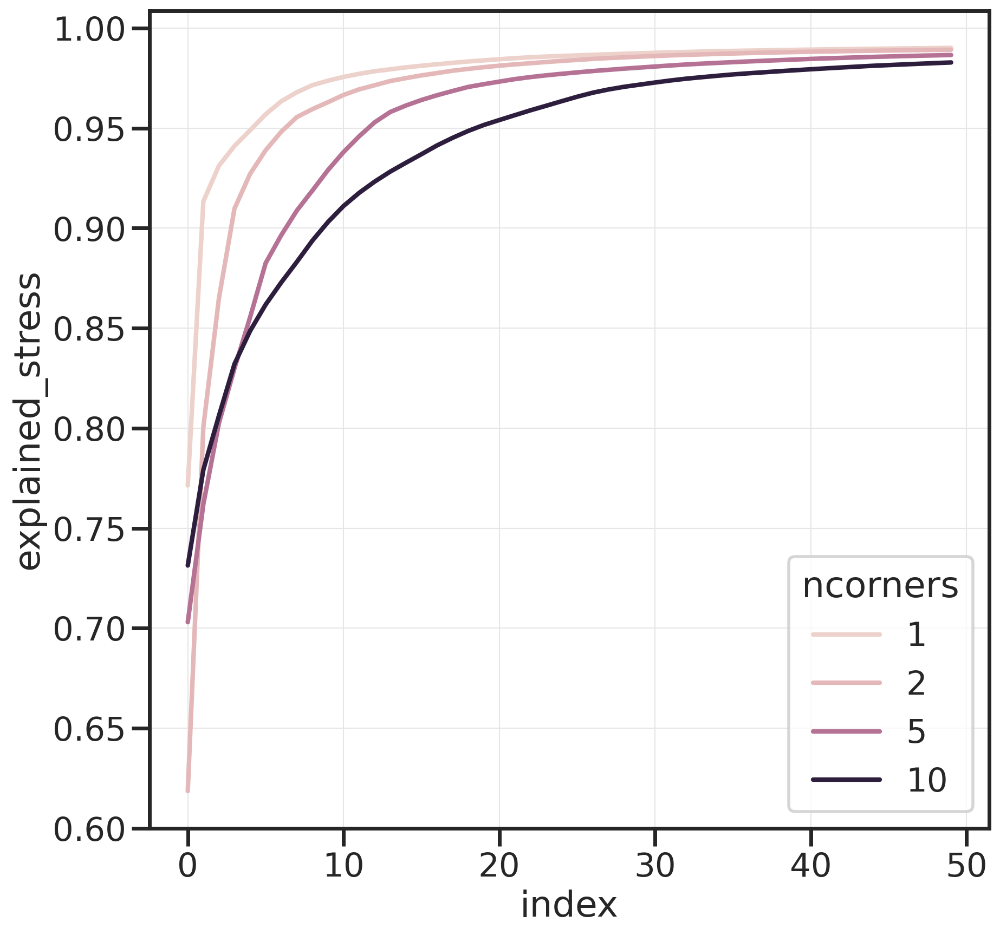

In [5]:
sns.lineplot(data=alld.reset_index(drop=True), x='index', y='explained_stress', hue='ncorners')

<AxesSubplot:xlabel='index', ylabel='explained_stress'>

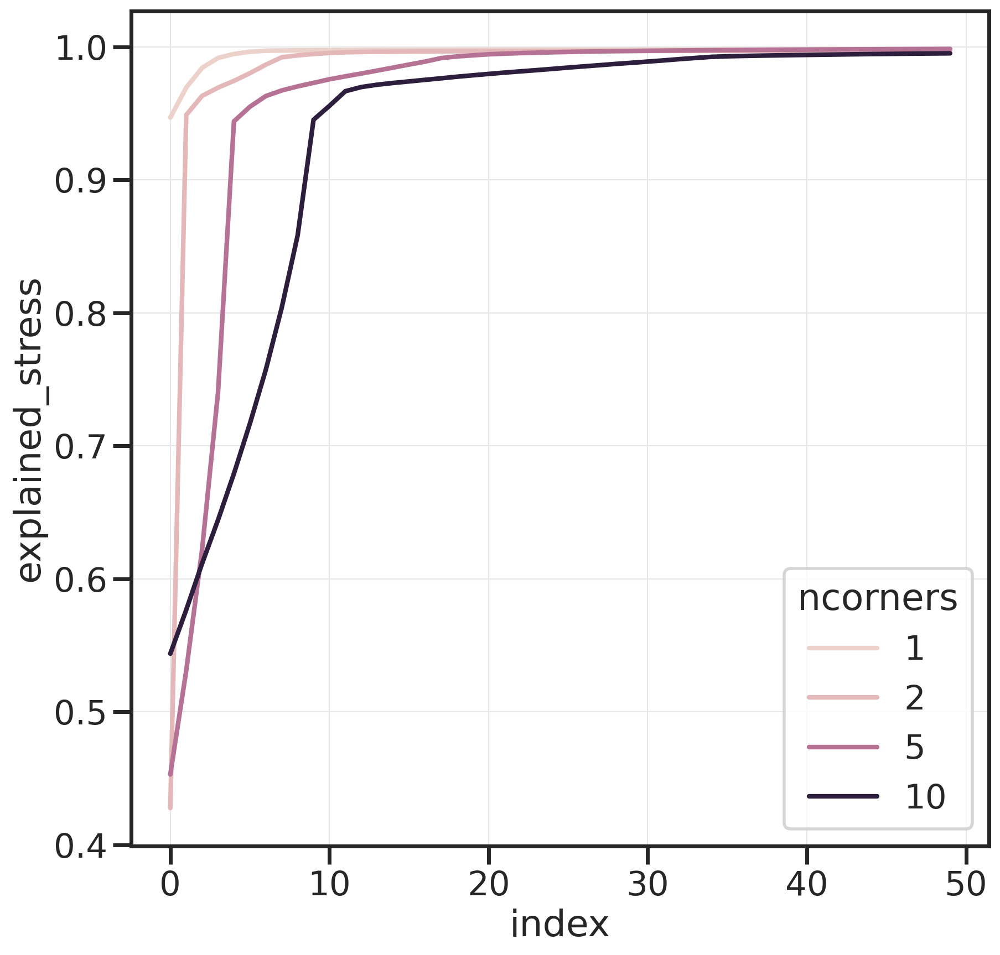

In [10]:
sns.lineplot(data=alld.reset_index(drop=True), x='index', y='explained_stress', hue='ncorners')

In [7]:
from utils import plotly_3d
fig = plotly_3d(dc=didx.reset_index(drop=True), r=r,
          opacity=0.5,
          color_axis=True,
          # cdict=CDICT_M,
          ne=5,
          size=2,
          color='err', 
            discrete_c=False,
#           colorscale='vlag',
          legend=True,
          cols=['seed',  'm', 'opt', 'err', 'verr', 't', 
                'bs', 'aug', 'lr', 'wd'],
          xrange=[r['xp'][:, 0].min(), r['xp'][:, 0].max()],
          yrange=[r['xp'][:, 1].min(), r['xp'][:, 1].max()],
          zrange=[r['xp'][:, 2].min(), r['xp'][:, 2].max()]
          )
fig.show()

[1174.9028   186.64989  129.18456  118.06241   88.49171   75.39276
  -66.08919]


In [11]:
from utils import plotly_3d
fig = plotly_3d(dc=didx.reset_index(drop=True), r=r,
          opacity=0.5,
          color_axis=True,
          # cdict=CDICT_M,
          ne=5,
          size=2,
          color='err', 
            discrete_c=False,
#           colorscale='vlag',
          legend=True,
          cols=['seed',  'm', 'opt', 'err', 'verr', 't', 
                'bs', 'aug', 'lr', 'wd'],
          xrange=[r['xp'][:, 0].min(), r['xp'][:, 0].max()],
          yrange=[r['xp'][:, 1].min(), r['xp'][:, 1].max()],
          zrange=[r['xp'][:, 2].min(), r['xp'][:, 2].max()]
          )
fig.show()

[5107.298    976.7205   967.0175   894.9682   882.0097   863.8243
  837.32837]


### Tangent vectors

In [ ]:
from utils import load_d
from reparameterization import gamma
from utils.distance import dbhat
from embed import lazy_embed, proj_

In [ ]:
def numerical_deriv(y,i,winlen):
    # y [T, N, C]
    derivative_ = 0
    for j in range(1,winlen):
        derivative_ +=(y[i+j,:,:]-y[i-j,:,:])/(2*j)
    return derivative_/(winlen-1)

In [ ]:
N = 5000
C = 5
fn = 'nonsloppy-50'
data = th.load('/home/ubuntu/ext_vol/data/synthetic/fc-200-50-5-0.5.pt')
truth = np.zeros([N, C])
truth[np.arange(N), data['train'].y] = 1
ignorance = np.ones((N,C))/C
geod = np.stack([gamma(t, np.sqrt(ignorance), truth) ** 2 for t in np.linspace(0, 1, 50)])

In [ ]:
all_files = glob.glob(f'/home/ubuntu/ext_vol/inpca/results/models/{fn}/*.p')

In [ ]:
dinits = []
dfins = []
for f in all_files:
    d = load_d([f])
    yh = np.stack(d.yh)
    dinits.append(numerical_deriv(yh[:10, :, :], 5, 5))
    dfins.append(numerical_deriv(yh[-10:, :, :], 5, 5))

In [ ]:
dinit = np.stack(dinits)
dfin = np.stack(dfins)

In [ ]:
dinit_ = dinit.reshape(dinit.shape[0], -1)
dfin_ = dfin.reshape(dfin.shape[0], -1)

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca = PCA(n_components=9)
pca.fit(dinit_.T)
pca.explained_variance_ratio_

In [ ]:
avg_tangent_init_ = PCA(n_components=9).fit_transform(dinit_.T)[:, 0].reshape([N, C])
avg_tangent_fin_ = dfin.mean(0)

In [ ]:
avg_tangent_init_ = dinit.mean(0)
avg_tangent_fin_ = dfin.mean(0)

In [ ]:
init_ray_list = np.array([ignorance +avg_tangent_init_*i for i in np.linspace(0,50,50)])
init_ray_list[init_ray_list<0] = 0
init_ray_list /= np.sum(init_ray_list,2,keepdims = True)

In [ ]:
all_tangents_init = np.vstack([ignorance[None, :, :] +dinit*i for i in np.linspace(0,50,50)])
all_tangents_init[all_tangents_init<0] = 0
all_tangents_init /= np.sum(all_tangents_init,2,keepdims = True)

In [ ]:
end_ray_list = np.array([truth - avg_tangent_fin_*i for i in np.linspace(0,50,50)])
end_ray_list[end_ray_list<0] = 0
end_ray_list /= np.sum(end_ray_list,2,keepdims = True)

In [ ]:
all_tangents_end = np.vstack([truth[None, :, :] - dfin*i for i in np.linspace(0,50,50)])
all_tangents_end[all_tangents_end<0] = 0
all_tangents_end /= np.sum(all_tangents_end,2,keepdims = True)

In [ ]:
all_points = np.vstack([init_ray_list, end_ray_list, geod])
all_points /= all_points.sum(-1, keepdims=True)

In [ ]:
w = dbhat(th.Tensor(all_points), th.Tensor(all_points), chunks=5000)

In [ ]:
all_tangents = np.vstack([all_tangents_init, all_tangents_end])
dextra = dbhat(th.Tensor(all_points), th.Tensor(all_tangents), chunks=500)

In [ ]:
n = len(w)
ne = 3
d_mean = w.mean(0)
l = np.eye(w.shape[0]) - 1.0 / w.shape[0]
w = -l @ w @ l / 2
r = proj_(w, n, ne)

In [ ]:
r['xp'].shape

In [ ]:
df = pd.DataFrame(r['xp'], columns=[f'x{i}' for i in range(r['xp'].shape[1])])
df.loc[:50, 'src'] = 'init_mean'
df.loc[50:100, 'src'] = 'end_mean'
df.loc[100:150, 'src'] = 'geod'

In [ ]:
xx = lazy_embed(dp=dextra.T, evals=r['e'], evecs=r['v'], d_mean=d_mean)
allxx = np.vstack([r['xp'], xx])

In [ ]:
df = pd.DataFrame(allxx, columns=[f'x{i}' for i in range(r['xp'].shape[1])])
df.loc[:50, 'src'] = 'init_mean'
df.loc[50:100, 'src'] = 'end_mean'
df.loc[100:150, 'src'] = 'geod'
df.loc[150:150+8000, 'src'] = 'init'
df.loc[150+8000:150+16000, 'src'] = 'end'

In [ ]:
import plotly.express as px
axis_range = [-0.5, 0.5]
fig = px.scatter_3d(df, x='x0', y='x1', z='x2', color='src')
fig.update_traces(marker=dict(size=2))
fig.update_layout(
            autosize=False,
        width=1000,
        height=1000,
        scene_xaxis_range=axis_range,
    scene_yaxis_range=axis_range,
    scene_zaxis_range=axis_range,
    scene_aspectmode='cube')
fig.show()